In [1]:
import numpy
import tqdm
import scipy
import scipy.stats
import matplotlib
import matplotlib.pyplot
from joblib import dump, load
%matplotlib inline

In [2]:
# specify the dataset settings (a mixutre of gaussian)

pi = numpy.array([0.5, 0.5])
ita_0 = numpy.array([0.5, 0.5])
ita_1 = numpy.array([0.5, 0.5])
mu_0_0 = numpy.array([4.0]) 
mu_0_1 = numpy.array([-64.0]) 
mu_1_0 = numpy.array([-4.0])
mu_1_1 = numpy.array([72.0 ]) 
cov_0_0 = numpy.array([960.0])
cov_0_1 = numpy.array([1280.0])
cov_1_0 = numpy.array([980.0])
cov_1_1 = numpy.array([1024.0])

In [3]:
# generate the feature and label samples

N = 10000
y = scipy.stats.multinomial.rvs(p=numpy.hstack([pi[0]*ita_0, pi[1]*ita_1]), size=N, n=1)
x = [scipy.stats.multivariate_normal.rvs(mean=mu_0_0, cov=cov_0_0, size=N).reshape(-1, 1),
     scipy.stats.multivariate_normal.rvs(mean=mu_0_1, cov=cov_0_1, size=N).reshape(-1, 1),
     scipy.stats.multivariate_normal.rvs(mean=mu_1_0, cov=cov_1_0, size=N).reshape(-1, 1),
     scipy.stats.multivariate_normal.rvs(mean=mu_1_1, cov=cov_1_1, size=N).reshape(-1, 1)]

x = x[0] * y[:, 0].reshape(-1, 1) + x[1] * y[:, 1].reshape(-1, 1) + \
    x[2] * y[:, 2].reshape(-1, 1) + x[3] * y[:, 3].reshape(-1, 1)

y = numpy.vstack([y[:, 0] + y[:, 1],
                  y[:, 2] + y[:, 3]]).transpose()

In [4]:
# specify the visualisation settings

N_grid = 1024
edge = 160.0
v_edge = 160.0
x_mesh = numpy.linspace(-edge, edge, N_grid).reshape(-1, 1)

In [5]:
# calculate the corresponding densities and probabilities

p_x_y = numpy.vstack([pi[0] * ita_0[0] * scipy.stats.multivariate_normal.pdf(x=x_mesh, mean=mu_0_0, cov=cov_0_0) +
                      pi[1] * ita_0[1] * scipy.stats.multivariate_normal.pdf(x=x_mesh, mean=mu_0_1, cov=cov_0_1),
                      pi[1] * ita_1[0] * scipy.stats.multivariate_normal.pdf(x=x_mesh, mean=mu_1_0, cov=cov_1_0) +
                      pi[1] * ita_1[1] * scipy.stats.multivariate_normal.pdf(x=x_mesh, mean=mu_1_1, cov=cov_1_1)])

p_x =  numpy.sum(p_x_y, axis=0)

p_y_g_x = p_x_y / p_x

p_x = p_x
p_x_y = p_x_y
p_x_g_y = p_x_y / pi.reshape(-1, 1)

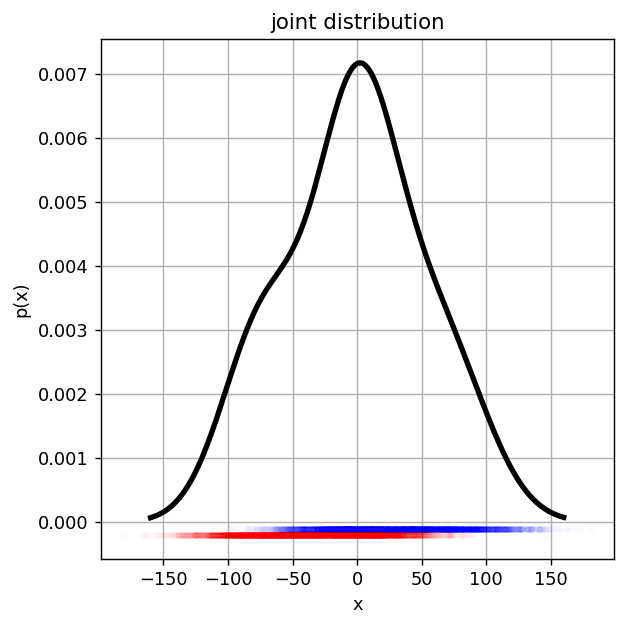

In [6]:
# joint densities

matplotlib.pyplot.figure(dpi=128, figsize=(5, 5))
matplotlib.pyplot.plot(-x_mesh, p_x, 'k', linewidth=3.0)
matplotlib.pyplot.plot(-x[y[:, 0]==1], numpy.zeros(numpy.sum(y[:, 0]==1)) - 1e-4, 'bo', markersize=3, alpha=0.01)
matplotlib.pyplot.plot(-x[y[:, 0]==0], numpy.zeros(numpy.sum(y[:, 0]==0)) - 2e-4, 'ro', markersize=3, alpha=0.01)
matplotlib.pyplot.xlabel('x')
matplotlib.pyplot.ylabel('p(x)')
matplotlib.pyplot.title('joint distribution')
matplotlib.pyplot.grid()
matplotlib.pyplot.tight_layout()

Text(0.5, 1.0, 'class 2 distribution')

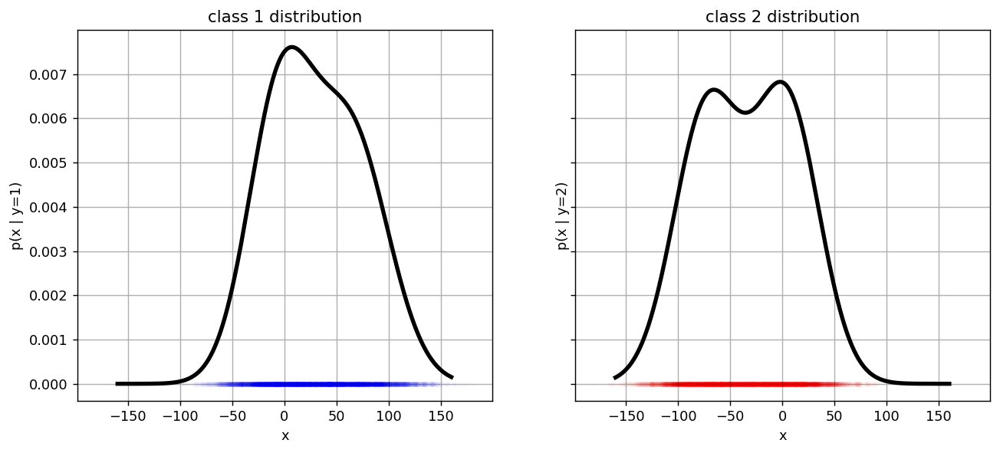

In [7]:
# conditional densities 

fig, axlist = matplotlib.pyplot.subplots(1, 2, dpi=128, figsize=(12, 5), sharex=True, sharey=True)
axlist[0].plot(-x_mesh, p_x_g_y[0, :], 'k', linewidth=3.0)
axlist[0].plot(-x[y[:, 0]==1], numpy.zeros(numpy.sum(y[:, 0]==1)), 'bo', markersize=3, alpha=0.01)
axlist[0].grid()
axlist[0].set_xlabel('x')
axlist[0].set_ylabel('p(x | y=1)')
axlist[0].set_title('class 1 distribution')
axlist[1].plot(-x_mesh, p_x_g_y[1, :], 'k', linewidth=3.0)
axlist[1].plot(-x[y[:, 0]==0], numpy.zeros(numpy.sum(y[:, 0]==0)), 'ro', markersize=3, alpha=0.01)
axlist[1].grid()
axlist[1].set_xlabel('x')
axlist[1].set_ylabel('p(x | y=2)')
axlist[1].set_title('class 2 distribution')

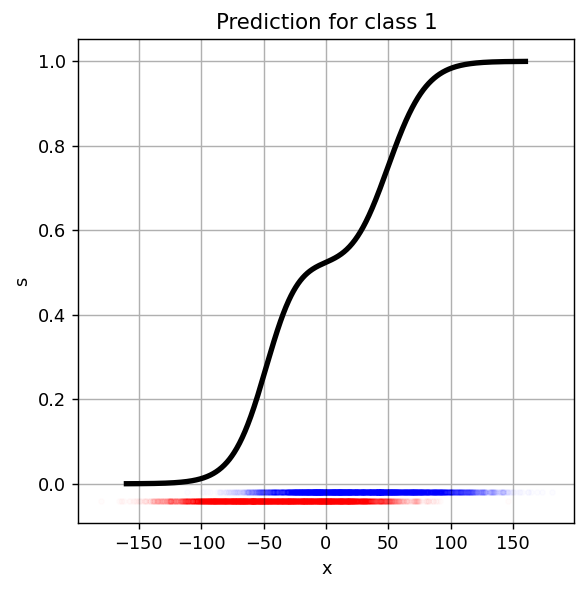

In [8]:
# predicted probabilities for class 1
matplotlib.pyplot.figure(dpi=128, figsize=(5, 5))
matplotlib.pyplot.plot(-x_mesh, p_y_g_x[0], 'k', linewidth=3.0)
matplotlib.pyplot.plot(-x[y[:, 0]==1], numpy.zeros(numpy.sum(y[:, 0]==1)) - 2e-2, 'bo', markersize=3, alpha=0.01)
matplotlib.pyplot.plot(-x[y[:, 0]==0], numpy.zeros(numpy.sum(y[:, 0]==0)) - 4e-2, 'ro', markersize=3, alpha=0.01)
# matplotlib.pyplot.ylim([0, 1])
matplotlib.pyplot.xlabel('x')
matplotlib.pyplot.ylabel('s')
matplotlib.pyplot.title('Prediction for class 1')
matplotlib.pyplot.grid()

In [9]:
# calculate densities of the predicted probabilities

N = int(1e6)
N_sim = int(128)
p_s = numpy.zeros(N_grid-1)
p_s_0 = numpy.zeros(N_grid-1)
p_s_1 = numpy.zeros(N_grid-1)
for i in tqdm.trange(0, N_sim):
    y = scipy.stats.multinomial.rvs(p=numpy.hstack([pi[0]*ita_0, pi[1]*ita_1]), size=N, n=1)

    x = [scipy.stats.multivariate_normal.rvs(mean=mu_0_0, cov=cov_0_0, size=N).reshape(-1, 1),
         scipy.stats.multivariate_normal.rvs(mean=mu_0_1, cov=cov_0_1, size=N).reshape(-1, 1),
         scipy.stats.multivariate_normal.rvs(mean=mu_1_0, cov=cov_1_0, size=N).reshape(-1, 1),
         scipy.stats.multivariate_normal.rvs(mean=mu_1_1, cov=cov_1_1, size=N).reshape(-1, 1)]

    x = x[0] * y[:, 0].reshape(-1, 1) + x[1] * y[:, 1].reshape(-1, 1) + \
        x[2] * y[:, 2].reshape(-1, 1) + x[3] * y[:, 3].reshape(-1, 1)

    y = numpy.vstack([y[:, 0] + y[:, 1],
                      y[:, 2] + y[:, 3]]).transpose()

    p_x_y_sample = numpy.vstack([pi[0] * ita_0[0] * scipy.stats.multivariate_normal.pdf(x=x, mean=mu_0_0, cov=cov_0_0) +
                                 pi[0] * ita_0[1] * scipy.stats.multivariate_normal.pdf(x=x, mean=mu_0_1, cov=cov_0_1),
                                 pi[1] * ita_1[0] * scipy.stats.multivariate_normal.pdf(x=x, mean=mu_1_0, cov=cov_1_0) +
                                 pi[1] * ita_1[1] * scipy.stats.multivariate_normal.pdf(x=x, mean=mu_1_1, cov=cov_1_1)])

    p_x_sample =  numpy.sum(p_x_y_sample, axis=0)

    s_sample = (p_x_y_sample / p_x_sample).transpose()

    p_s = p_s + numpy.histogram(s_sample[:, 0], bins=numpy.linspace(0, 1, N_grid))[0]
    p_s_0 = p_s_0 + numpy.histogram(s_sample[y[:, 0]==1, 0], bins=numpy.linspace(0, 1, N_grid))[0]
    p_s_1 = p_s_1 + numpy.histogram(s_sample[y[:, 1]==1, 0], bins=numpy.linspace(0, 1, N_grid))[0]
    
p_s = p_s
p_s_0 = p_s_0
p_s_1 = p_s_1

100%|██████████| 128/128 [02:15<00:00,  1.06s/it]


In [10]:
# draw samples and calculate corresponding values

N = 10000
y = scipy.stats.multinomial.rvs(p=numpy.hstack([pi[0]*ita_0, pi[1]*ita_1]), size=N, n=1)
x = [scipy.stats.multivariate_normal.rvs(mean=mu_0_0, cov=cov_0_0, size=N).reshape(-1, 1),
     scipy.stats.multivariate_normal.rvs(mean=mu_0_1, cov=cov_0_1, size=N).reshape(-1, 1),
     scipy.stats.multivariate_normal.rvs(mean=mu_1_0, cov=cov_1_0, size=N).reshape(-1, 1),
     scipy.stats.multivariate_normal.rvs(mean=mu_1_1, cov=cov_1_1, size=N).reshape(-1, 1)]

x = x[0] * y[:, 0].reshape(-1, 1) + x[1] * y[:, 1].reshape(-1, 1) + \
    x[2] * y[:, 2].reshape(-1, 1) + x[3] * y[:, 3].reshape(-1, 1)

y = numpy.vstack([y[:, 0] + y[:, 1],
                  y[:, 2] + y[:, 3]]).transpose()

p_x_y_sample = numpy.vstack([pi[0] * ita_0[0] * scipy.stats.multivariate_normal.pdf(x=x, mean=mu_0_0, cov=cov_0_0) +
                             pi[0] * ita_0[1] * scipy.stats.multivariate_normal.pdf(x=x, mean=mu_0_1, cov=cov_0_1), 
                             pi[1] * ita_1[0] * scipy.stats.multivariate_normal.pdf(x=x, mean=mu_1_0, cov=cov_1_0) +
                             pi[1] * ita_1[1] * scipy.stats.multivariate_normal.pdf(x=x, mean=mu_1_1, cov=cov_1_1)])

p_x_sample =  numpy.sum(p_x_y_sample, axis=0)

s_sample = (p_x_y_sample / p_x_sample).transpose()

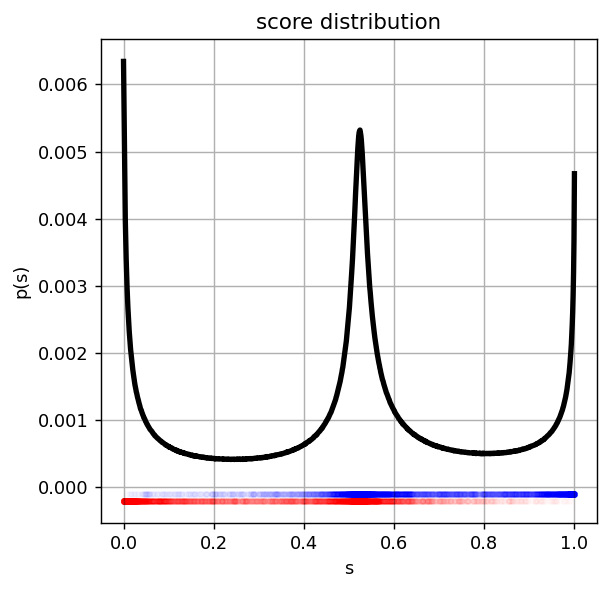

In [11]:
# joint density

matplotlib.pyplot.figure(dpi=128, figsize=(5, 5))
matplotlib.pyplot.plot(numpy.linspace(0, 1, N_grid-1), p_s/numpy.sum(p_s), 'k', linewidth=3.0)
matplotlib.pyplot.plot(s_sample[y[:, 0]==1, 0], numpy.zeros(numpy.sum(y[:, 0]==1)) - 1e-4, 'bo', markersize=3, alpha=0.01)
matplotlib.pyplot.plot(s_sample[y[:, 0]==0, 0], numpy.zeros(numpy.sum(y[:, 0]==0)) - 2e-4, 'ro', markersize=3, alpha=0.01)
matplotlib.pyplot.xlabel('s')
matplotlib.pyplot.ylabel('p(s)')
matplotlib.pyplot.title('score distribution')
matplotlib.pyplot.grid()

Text(0.5, 1.0, 'class 2 distribution')

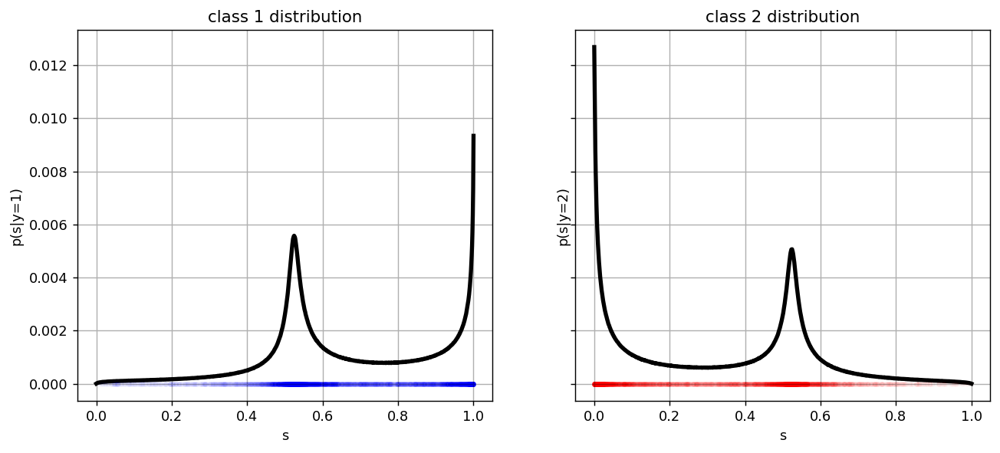

In [12]:
# class-wise conditional density

fig, axlist = matplotlib.pyplot.subplots(1, 2, dpi=128, figsize=(12, 5), sharex=True, sharey=True)
axlist[0].plot(numpy.linspace(0, 1, N_grid-1), p_s_0/numpy.sum(p_s_0), 'k', linewidth=3)
axlist[0].plot(s_sample[y[:, 0]==1, 0], numpy.zeros(numpy.sum(y[:, 0]==1)), 'bo', markersize=3, alpha=0.01)
axlist[0].grid()
axlist[0].set_xlabel('s')
axlist[0].set_ylabel('p(s|y=1)')
axlist[0].set_title('class 1 distribution')
axlist[1].plot(numpy.linspace(0, 1, N_grid-1), p_s_1/numpy.sum(p_s_1), 'k', linewidth=3)
axlist[1].plot(s_sample[y[:, 0]==0, 0], numpy.zeros(numpy.sum(y[:, 0]==0)), 'ro', markersize=3, alpha=0.01)
axlist[1].grid()
axlist[1].set_xlabel('s')
axlist[1].set_ylabel('p(s|y=2)')
axlist[1].set_title('class 2 distribution')

In [13]:
# calculate related probabilities

p_x_y_hat = numpy.vstack([pi[0] * p_s_0.ravel(),
                          pi[1] * p_s_1.ravel()])

p_x_hat =  numpy.sum(p_x_y_hat, axis=0)

p_y_hat = p_x_y_hat / p_x_hat

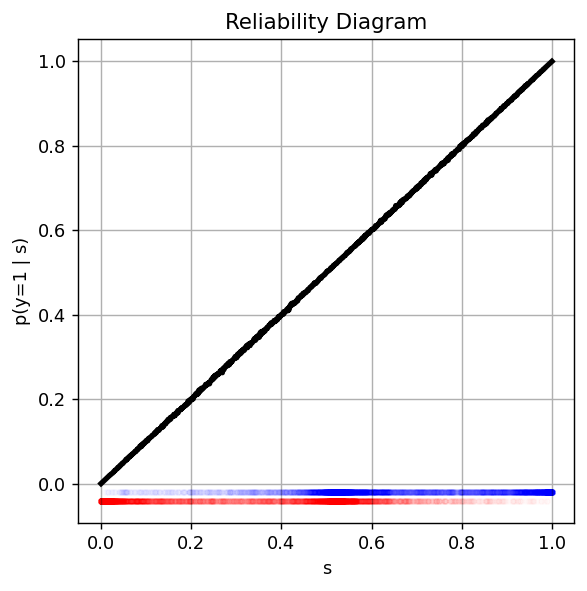

In [14]:
# draw reliability diagram

matplotlib.pyplot.figure(dpi=128, figsize=(5, 5))
matplotlib.pyplot.plot(numpy.linspace(0, 1, N_grid-1), p_y_hat[0, :], 'k', linewidth=3)
matplotlib.pyplot.plot(s_sample[y[:, 0]==1, 0], numpy.zeros(numpy.sum(y[:, 0]==1)) - 2e-2, 'bo', markersize=3, alpha=0.01)
matplotlib.pyplot.plot(s_sample[y[:, 0]==0, 0], numpy.zeros(numpy.sum(y[:, 0]==0)) - 4e-2, 'ro', markersize=3, alpha=0.01)
matplotlib.pyplot.xlabel('s')
matplotlib.pyplot.ylabel('p(y=1 | s)')
matplotlib.pyplot.title('Reliability Diagram')
matplotlib.pyplot.grid()

In [15]:
# generate the feature and label samples

N = 10000
y = scipy.stats.multinomial.rvs(p=numpy.hstack([pi[0]*ita_0, pi[1]*ita_1]), size=N, n=1)
x = [scipy.stats.multivariate_normal.rvs(mean=mu_0_0, cov=cov_0_0, size=N).reshape(-1, 1),
     scipy.stats.multivariate_normal.rvs(mean=mu_0_1, cov=cov_0_1, size=N).reshape(-1, 1),
     scipy.stats.multivariate_normal.rvs(mean=mu_1_0, cov=cov_1_0, size=N).reshape(-1, 1),
     scipy.stats.multivariate_normal.rvs(mean=mu_1_1, cov=cov_1_1, size=N).reshape(-1, 1)]

x = x[0] * y[:, 0].reshape(-1, 1) + x[1] * y[:, 1].reshape(-1, 1) + \
    x[2] * y[:, 2].reshape(-1, 1) + x[3] * y[:, 3].reshape(-1, 1)

y = numpy.vstack([y[:, 0] + y[:, 1],
                  y[:, 2] + y[:, 3]]).transpose()

In [16]:
# train a NN classifier 
mdl = load('../models/mlp.joblib')

/home/sh/anaconda3/lib/python3.7/site-packages/sklearn/base.py:315: UserWarning: Trying to unpickle estimator LabelBinarizer from version 0.23.1 when using version 0.24.1. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)
/home/sh/anaconda3/lib/python3.7/site-packages/sklearn/base.py:315: UserWarning: Trying to unpickle estimator MLPClassifier from version 0.23.1 when using version 0.24.1. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)


In [17]:
# get predicted scores on samples
s = mdl.predict_proba(x)

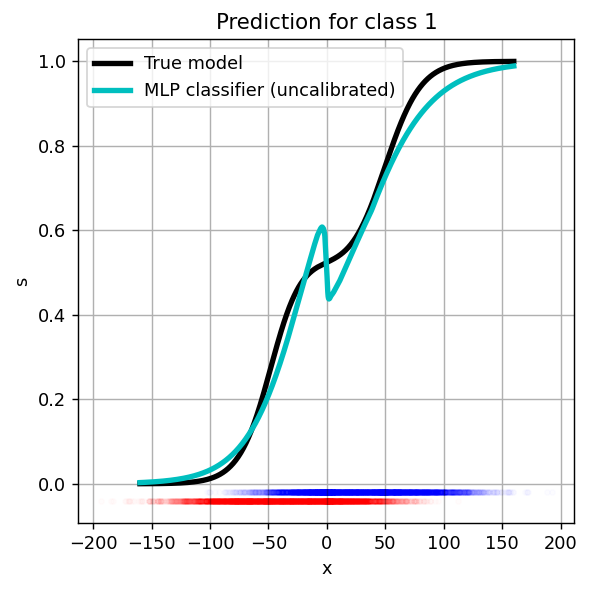

In [18]:
# predicted probabilities for class 1
x_mesh = numpy.linspace(-edge, edge, N_grid).reshape(-1, 1)
s_mesh = mdl.predict_proba(x_mesh)

matplotlib.pyplot.figure(dpi=128, figsize=(5, 5))
matplotlib.pyplot.plot(-x_mesh, p_y_g_x[0], 'k', linewidth=3.0)
matplotlib.pyplot.plot(-x_mesh, s_mesh[:, 0], 'c', linewidth=3.0)
matplotlib.pyplot.plot(-x[y[:, 0]==1], numpy.zeros(numpy.sum(y[:, 0]==1)) - 2e-2, 'bo', markersize=3, alpha=0.01)
matplotlib.pyplot.plot(-x[y[:, 0]==0], numpy.zeros(numpy.sum(y[:, 0]==0)) - 4e-2, 'ro', markersize=3, alpha=0.01)
# matplotlib.pyplot.ylim([0, 1])
matplotlib.pyplot.xlabel('x')
matplotlib.pyplot.ylabel('s')
matplotlib.pyplot.title('Prediction for class 1')
matplotlib.pyplot.grid()
matplotlib.pyplot.legend(['True model', 'MLP classifier (uncalibrated)'])

In [19]:
# calculate densities of the predicted probabilities

s_mesh = mdl.predict_proba(x_mesh)

s_plot = (numpy.linspace(0, 1, N_grid)[:-1] +  numpy.linspace(0, 1, N_grid)[1:]) / 2

upper_edge = s_mesh[:, 0] + 0.05
lower_edge = s_mesh[:, 0] - 0.05

N = int(4096)
N_sim = int(1e4)

p_s = numpy.zeros(N_grid-1) + 1e-16
p_s_0 = numpy.zeros(N_grid-1) + 1e-16
p_s_1 = numpy.zeros(N_grid-1) + 1e-16

p_s_hat = numpy.zeros(N_grid-1) + 1e-16
p_s_0_hat = numpy.zeros(N_grid-1) + 1e-16
p_s_1_hat = numpy.zeros(N_grid-1) + 1e-16

s_cal = numpy.zeros(numpy.shape(s_mesh[:, 0]))

for i in tqdm.trange(0, N_sim):
    y = scipy.stats.multinomial.rvs(p=numpy.hstack([pi[0]*ita_0, pi[1]*ita_1]), size=N, n=1)

    x = [scipy.stats.multivariate_normal.rvs(mean=mu_0_0, cov=cov_0_0, size=N).reshape(-1, 1),
         scipy.stats.multivariate_normal.rvs(mean=mu_0_1, cov=cov_0_1, size=N).reshape(-1, 1),
         scipy.stats.multivariate_normal.rvs(mean=mu_1_0, cov=cov_1_0, size=N).reshape(-1, 1),
         scipy.stats.multivariate_normal.rvs(mean=mu_1_1, cov=cov_1_1, size=N).reshape(-1, 1)]

    x = x[0] * y[:, 0].reshape(-1, 1) + x[1] * y[:, 1].reshape(-1, 1) + \
        x[2] * y[:, 2].reshape(-1, 1) + x[3] * y[:, 3].reshape(-1, 1)

    y = numpy.vstack([y[:, 0] + y[:, 1],
                      y[:, 2] + y[:, 3]]).transpose()

    p_x_y_sample = numpy.vstack([pi[0] * ita_0[0] * scipy.stats.multivariate_normal.pdf(x=x, mean=mu_0_0, cov=cov_0_0) +
                                 pi[0] * ita_0[1] * scipy.stats.multivariate_normal.pdf(x=x, mean=mu_0_1, cov=cov_0_1),
                                 pi[1] * ita_1[0] * scipy.stats.multivariate_normal.pdf(x=x, mean=mu_1_0, cov=cov_1_0) +
                                 pi[1] * ita_1[1] * scipy.stats.multivariate_normal.pdf(x=x, mean=mu_1_1, cov=cov_1_1)])

    p_x_sample =  numpy.sum(p_x_y_sample, axis=0)

    s_sample = (p_x_y_sample / p_x_sample).transpose()
    
    s_sample_hat = mdl.predict_proba(x)
    
    s_cal = s_cal + \
    numpy.sum(((s_sample_hat[y[:, 0]==1, 0].reshape(-1, 1) - lower_edge.reshape(1, -1)) >= 0) & 
               ((s_sample_hat[y[:, 0]==1, 0].reshape(-1, 1) - upper_edge.reshape(1, -1)) < 0), axis=0) / \
    numpy.sum(((s_sample_hat[:, 0].reshape(-1, 1) - lower_edge.reshape(1, -1)) >= 0) & 
               ((s_sample_hat[:, 0].reshape(-1, 1) - upper_edge.reshape(1, -1)) < 0), axis=0)

    p_s = p_s + numpy.histogram(s_sample[:, 0], bins=numpy.linspace(0, 1, N_grid), density=True)[0]
    p_s_0 = p_s_0 + numpy.histogram(s_sample[y[:, 0]==1, 0], bins=numpy.linspace(0, 1, N_grid), density=True)[0]
    p_s_1 = p_s_1 + numpy.histogram(s_sample[y[:, 1]==1, 0], bins=numpy.linspace(0, 1, N_grid), density=True)[0]
    
    p_s_hat = p_s_hat + numpy.histogram(s_sample_hat[:, 0], bins=numpy.linspace(0, 1, N_grid), density=True)[0]
    p_s_0_hat = p_s_0_hat + numpy.histogram(s_sample_hat[y[:, 0]==1, 0], bins=numpy.linspace(0, 1, N_grid), density=True)[0]
    p_s_1_hat = p_s_1_hat + numpy.histogram(s_sample_hat[y[:, 1]==1, 0], bins=numpy.linspace(0, 1, N_grid), density=True)[0]
    

p_s = p_s / N_sim
p_s_0 = p_s_0 / N_sim
p_s_1 = p_s_1 / N_sim
    
p_s_hat = p_s_hat / N_sim
p_s_0_hat = p_s_0_hat / N_sim
p_s_1_hat = p_s_1_hat / N_sim

s_cal = s_cal / N_sim

100%|██████████| 10000/10000 [19:22<00:00,  8.60it/s]


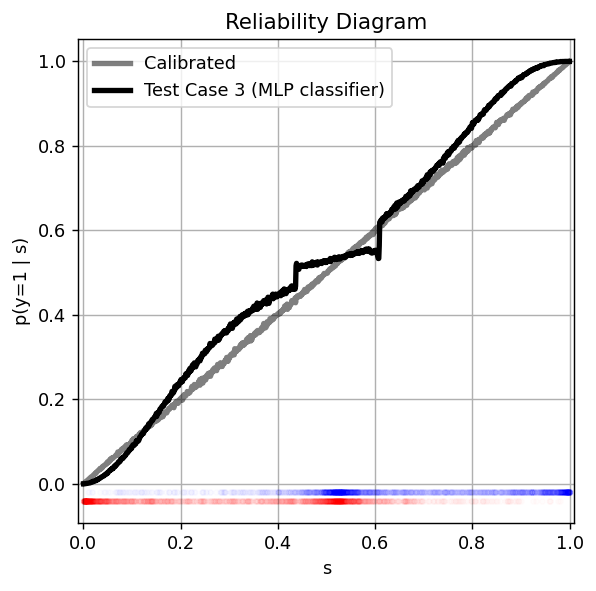

In [21]:
tmp_s = pi[0] * p_s_0_hat / (pi[0] * p_s_0_hat + pi[1] * p_s_1_hat)
idx = numpy.argsort(tmp_s)
s_plot = (numpy.linspace(0, 1, N_grid)[:-1] +  numpy.linspace(0, 1, N_grid)[1:]) / 2

matplotlib.pyplot.figure(dpi=128, figsize=(5, 5))
matplotlib.pyplot.plot((numpy.linspace(0, 1, N_grid)[:-1] +  numpy.linspace(0, 1, N_grid)[1:]) / 2, 
                       pi[0] * p_s_0 / (pi[0] * p_s_0 + pi[1] * p_s_1), 'k', linewidth=3, alpha=0.5)
matplotlib.pyplot.plot((numpy.linspace(0, 1, N_grid)[:-1] +  numpy.linspace(0, 1, N_grid)[1:]) / 2, 
                       pi[0] * p_s_0_hat / (pi[0] * p_s_0_hat + pi[1] * p_s_1_hat), 'k', linewidth=3)
# matplotlib.pyplot.plot((numpy.linspace(0, 1, N_grid)[:-1] +  numpy.linspace(0, 1, N_grid)[1:]) / 2, 
#                        pi[0] * p_s_0_hat / (pi[0] * p_s_0_hat + pi[1] * p_s_1_hat) - pi[0] * p_s_0 / (pi[0] * p_s_0 + pi[1] * p_s_1),
#                        'y', linewidth=3)
# matplotlib.pyplot.plot(tmp_s[idx],  
#                        pi[0] * p_s_0_hat[idx] / (pi[0] * p_s_0_hat[idx] + pi[1] * p_s_1_hat[idx]), 'm', linewidth=3)
# matplotlib.pyplot.legend(['True model', 'MLP classifier (uncalibrated)'])
matplotlib.pyplot.legend(['Calibrated', 'Test Case 3 (MLP classifier)'])
matplotlib.pyplot.title('Reliability Diagram')
matplotlib.pyplot.xlabel('s')
matplotlib.pyplot.ylabel('p(y=1 | s)')
matplotlib.pyplot.xlim([-0.01, 1.01])
matplotlib.pyplot.grid()

# matplotlib.pyplot.figure(dpi=128, figsize=(5, 0.2))
matplotlib.pyplot.plot(s_sample[y[:, 0]==1, 0], numpy.zeros(numpy.sum(y[:, 0]==1)) - 2e-2, 'bo', markersize=3, alpha=0.01)
matplotlib.pyplot.plot(s_sample[y[:, 0]==0, 0], numpy.zeros(numpy.sum(y[:, 0]==0)) - 4e-2, 'ro', markersize=3, alpha=0.01)
matplotlib.pyplot.savefig('../figures/test_case_3')

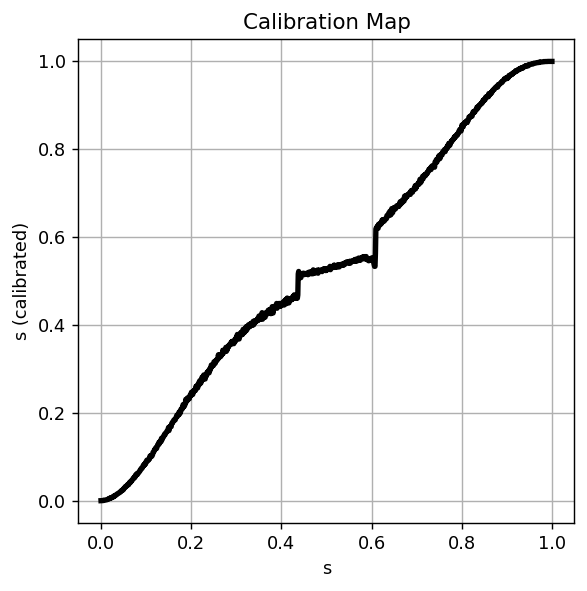

In [22]:
matplotlib.pyplot.figure(dpi=128, figsize=(5, 5))
matplotlib.pyplot.plot((numpy.linspace(0, 1, N_grid)[:-1] +  numpy.linspace(0, 1, N_grid)[1:]) / 2, 
                       pi[0] * p_s_0_hat / (pi[0] * p_s_0_hat + pi[1] * p_s_1_hat), 'k', linewidth=3)
matplotlib.pyplot.title('Calibration Map')
matplotlib.pyplot.xlabel('s')
matplotlib.pyplot.ylabel('s (calibrated)')
matplotlib.pyplot.grid()

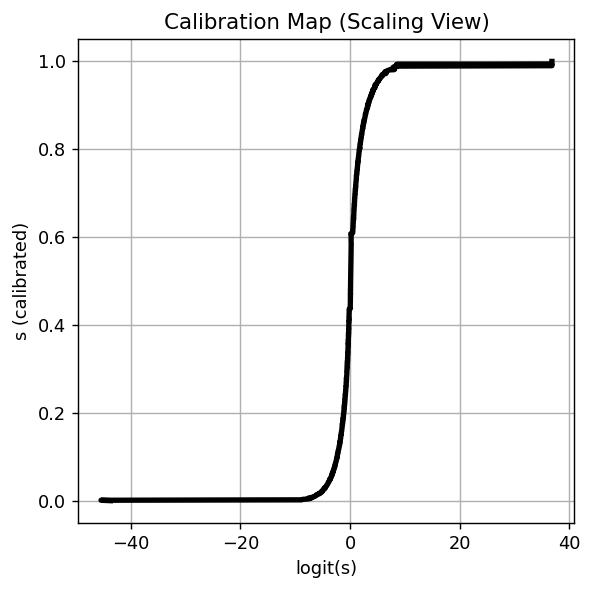

In [23]:
matplotlib.pyplot.figure(dpi=128, figsize=(5, 5))
matplotlib.pyplot.plot(numpy.log(pi[0] * p_s_0_hat / (pi[0] * p_s_0_hat + pi[1] * p_s_1_hat) / 
                                 (1 - pi[0] * p_s_0_hat / (pi[0] * p_s_0_hat + pi[1] * p_s_1_hat) + 1e-16)),
                       (numpy.linspace(0, 1, N_grid)[:-1] +  numpy.linspace(0, 1, N_grid)[1:]) / 2, 
                       'k', linewidth=3)
matplotlib.pyplot.title('Calibration Map (Scaling View)')
matplotlib.pyplot.xlabel('logit(s)')
matplotlib.pyplot.ylabel('s (calibrated)')
matplotlib.pyplot.grid()